Данные о клиентах банка:

* age (возраст);
* job (сфера занятости);
* marital (семейное положение);
* education (уровень образования);
* default (имеется ли просроченный кредит);
* housing (имеется ли кредит на жильё);
* loan (имеется ли кредит на личные нужды);
* balance (баланс).

Данные, связанные с последним контактом в контексте текущей маркетинговой кампании:

* contact (тип контакта с клиентом);
* month (месяц, в котором был последний контакт);
* day (день, в который был последний контакт);
* duration (продолжительность контакта в секундах).

Прочие признаки:

* campaign (количество контактов с этим клиентом в течение текущей кампании);
* pdays (количество пропущенных дней с момента последней маркетинговой кампании до контакта в текущей кампании);
* previous (количество контактов до текущей кампании)
* poutcome (результат прошлой маркетинговой кампании).

И, разумеется, наша целевая переменная deposit, которая определяет, согласится ли клиент открыть депозит в банке. Именно её мы будем пытаться предсказать в данном кейсе.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from  sklearn.ensemble import IsolationForest
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing  import LabelEncoder
from sklearn import linear_model 
from sklearn import tree 
from sklearn import ensemble 
from sklearn import metrics 
from sklearn import preprocessing 
from sklearn.model_selection import train_test_split 
from sklearn.feature_selection import SelectKBest, f_classif

## Знакомство с данными, обработка пропусков и выбросов

Загрузим исходные данные и проверим ланные на предмет пропусков

In [2]:
df = pd.read_csv('data/bank_fin.zip', sep = ';')
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,"2 343,00 $",yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,"45,00 $",no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,"1 270,00 $",yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,"2 476,00 $",yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,"184,00 $",no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11137 non-null  object
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(6), object(11)
memory usage: 1.4+ MB


In [3]:
df.isnull().sum()

age           0
job           0
marital       0
education     0
default       0
balance      25
housing       0
loan          0
contact       0
day           0
month         0
duration      0
campaign      0
pdays         0
previous      0
poutcome      0
deposit       0
dtype: int64

In [5]:
import re

balance = []
for value in df['balance'].values:
    if type(value) == float:
        balance.append(None)
    else:
        new_value = re.sub(r'[\$s]', '', value)
        result = re.sub(r' ', '', new_value)
        result = re.sub(r',', '.', result)
        balance.append(float(result))
    
df['balance'] = balance

In [6]:
df['balance'] = df['balance'].fillna(df['balance'].median())

In [7]:
df.loc[:, 'job'] = df.loc[:, 'job'].apply(lambda x: df['job'].mode()[0] if x =='unknown' else x)
df.loc[:, 'education'] = df.loc[:, 'education'].apply(lambda x: df['education'].mode()[0] if x == 'unknown' else x)

In [7]:
mask = (df['job'] == df['job'].value_counts().index[0])&(df['education'] == df['education'].value_counts().index[0])
np.round(df[mask].groupby(['job', 'education'])['balance'].mean(), 3)

job         education
management  secondary    1598.883
Name: balance, dtype: float64

Избавимся от выбросов методом Тьюки

In [9]:
def outliers_iqr(data, feature):
    
    x = data[feature]
    
    quartile_1, quartile_3 = np.quantile(x, 0.25), np.quantile(x, 0.75)
    iqr = quartile_3 - quartile_1
    
    lower_bound = quartile_1 - 1.5*iqr
    upper_bound = quartile_3 + 1.5*iqr
    
    outliers = data[(x < lower_bound)|(x > upper_bound)]
    cleaned = data[(x >= lower_bound)&(x <= upper_bound)]
    return outliers, cleaned
    

In [10]:
quartile_1 = df['balance'].quantile(0.25)
quartile_3 = df['balance'].quantile(0.75)

iqr = quartile_3 - quartile_1

lower_bound = quartile_1 - iqr*1.5 
upper_bound = quartile_3 + iqr*1.5

print(lower_bound)
print(upper_bound)

-2241.0
4063.0


In [10]:
outliers, cleaned = outliers_iqr(df, 'balance')
cleaned

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343.0,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45.0,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270.0,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476.0,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184.0,no,no,unknown,5,may,673,2,-1,0,unknown,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11157,33,blue-collar,single,primary,no,1.0,yes,no,cellular,20,apr,257,1,-1,0,unknown,no
11158,39,services,married,secondary,no,733.0,no,no,unknown,16,jun,83,4,-1,0,unknown,no
11159,32,technician,single,secondary,no,29.0,no,no,cellular,19,aug,156,2,-1,0,unknown,no
11160,43,technician,married,secondary,no,0.0,no,yes,cellular,8,may,9,2,172,5,failure,no


Альтернативные вариант избавления от выбросов: метод 3 сигм

In [22]:
def outliers_z_score(data, feature):
    
    x = data[feature]
    
    mu = x.mean()
    sigma = x.std()
    
    lower_bound = mu - 3*sigma
    upper_bound = mu + 3*sigma
    
    outliers = data[(x < lower_bound)|(x > upper_bound)]
    cleaned = data[(x >= lower_bound)&(x <= upper_bound)]
    return outliers, cleaned

In [10]:
outliers, cleaned = outliers_z_score(df, 'balance')
cleaned.shape

NameError: name 'outliers_z_score' is not defined

## Разведывательный анализ

4681


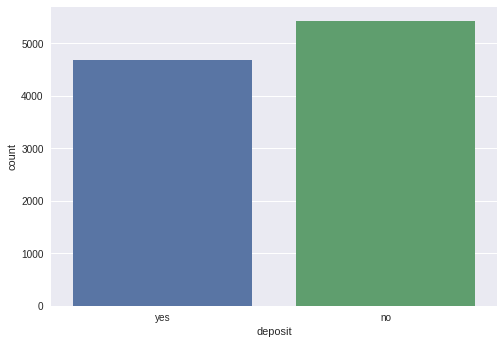

In [12]:
plt.style.use('seaborn')

mask = cleaned['deposit'] == 'yes'
print(cleaned[mask]['deposit'].count())
sns.countplot(data=cleaned, x='deposit');

Посмотрим на общие описательные статистики для количественных переменных

In [24]:
cleaned.describe()

,age,balance,day,duration,campaign,pdays,previous
count,10105.000000,10105.000000,10105.000000,10105.000000,10105.000000,10105.000000,10105.000000
mean,40.895497,807.653538,15.590302,368.742603,2.517170,51.319644,0.816230
std,11.734931,994.151966,8.441510,346.651524,2.707159,109.644179,2.243795
min,18.000000,-2049.000000,1.000000,2.000000,1.000000,-1.000000,0.000000
25%,32.000000,95.000000,8.000000,137.000000,1.000000,-1.000000,0.000000
50%,38.000000,445.000000,15.000000,252.000000,2.000000,-1.000000,0.000000
75%,48.000000,1227.000000,22.000000,490.000000,3.000000,2.000000,1.000000
max,95.000000,4063.000000,31.000000,3881.000000,43.000000,854.000000,58.000000


В признаке age мы наблюдаем возраст клиентов банка в диапазоне от 18 до 95 лет. Необходимо будет проверить зависимость открытия дипозита в завивсимости от возроста(для этого создадим новый признак принадлежности клиента банка к одной из возростных групп). ПРизнак balance: минимальное значение отрицательное, возможно это должники банка. 

При помощи инструментов визуализации посмотрим гистограммы распределений количественных признаков. Так же построим диаграммы рассеивания количественных переменных и переменной balance в разрезе целевой переменной deposit

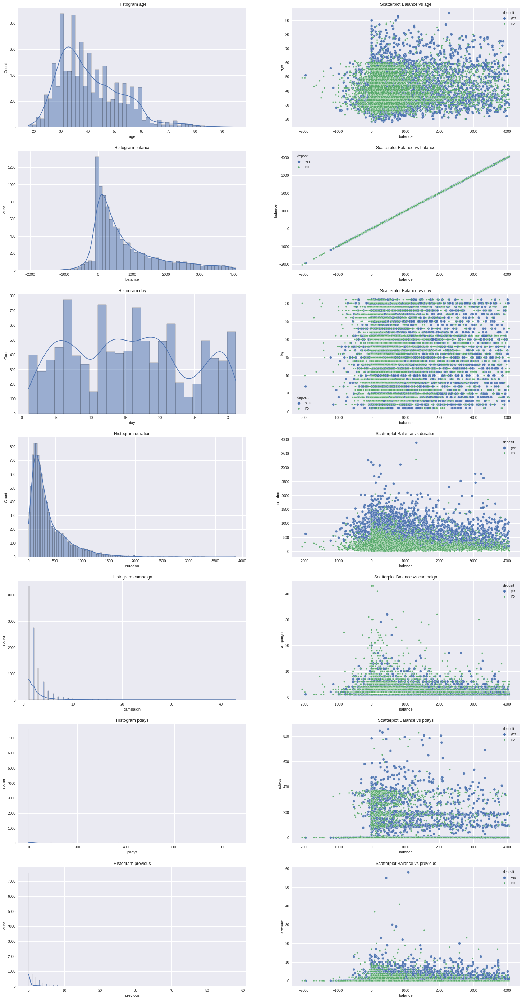

In [13]:
num_cols = [x for x in cleaned.columns if cleaned[x].dtype != 'object']

n = len(num_cols)

fig, axes = plt.subplots(n, 2, figsize=(25, 50))

for i, col in enumerate(num_cols):
    hist = sns.histplot(data=cleaned, x = col, ax=axes[i][0], kde=True)
    scatter = sns.scatterplot(data = cleaned, x = 'balance', y = col, hue='deposit', ax=axes[i][1], alpha=0.9, size='deposit', sizes=(20, 50))
    
    hist.set_title(f'Histogram {col}')
    scatter.set_title(f'Scatterplot Balance vs {col}')

Построим коробчатые диаграммы для количественных признаков

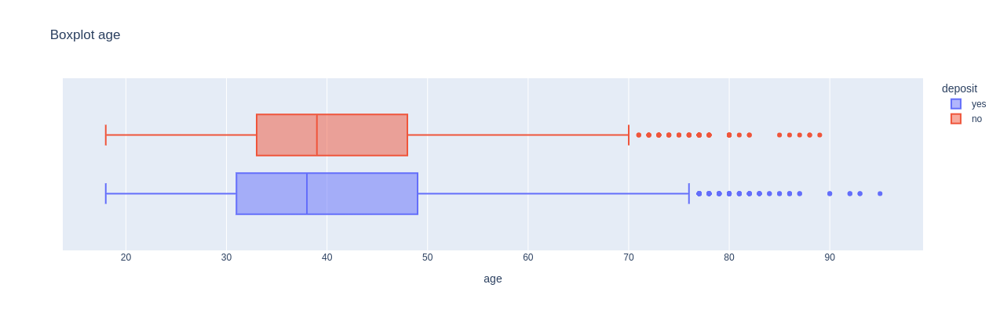

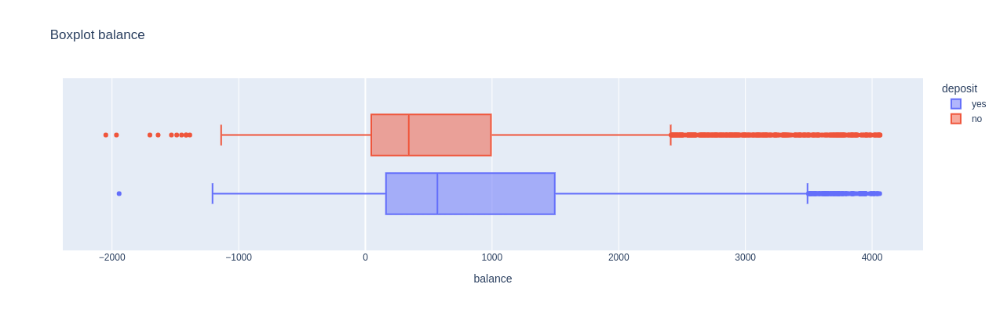

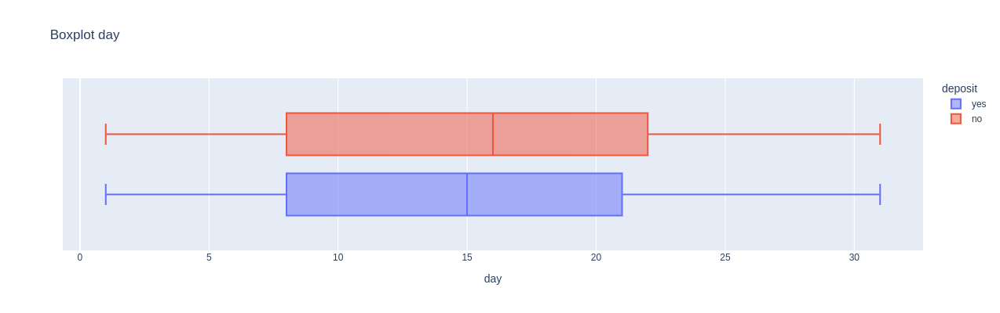

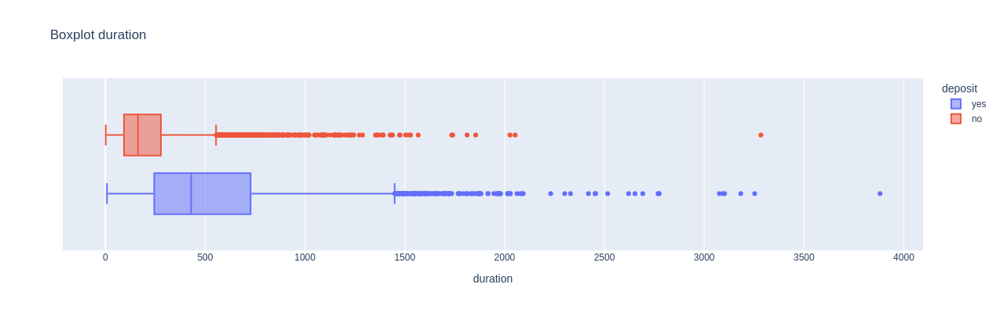

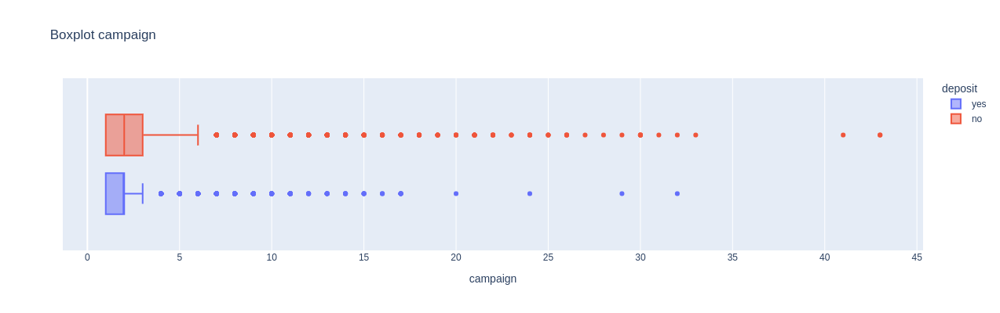

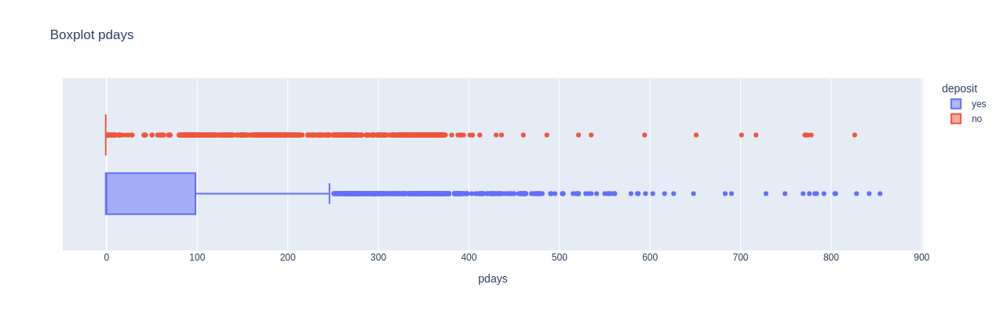

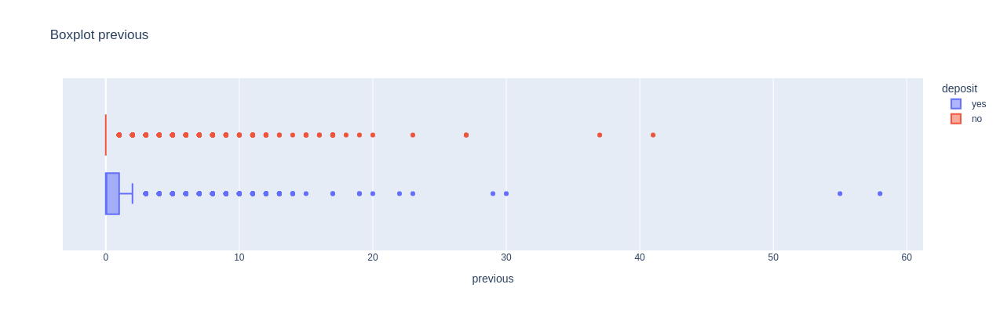

In [24]:
import plotly.express as px

for col in num_cols:
    fig = px.box(cleaned, x=col, color='deposit', width=800, height = 400, title=f'Boxplot {col}')
    fig.show()

На основе построенных графиков обратим внимание на следующие наблюдения:

* клиенты, чей возраст привышает 60 лет чаще соглашаются открыть депозит, чем отказываются. 
* клиенты, с которыми контакт в рамках текущей рекламной компании длился более 500 секунд чаще соглашаются открыть дипозит;
* клиенты, с момента контакта с которыми прошло более 400 дней в основном соглашаются открыть дипозит;
* клиенты, чей баланс привышает 1000 и с которыми ранее было более 5 контактов, чаще соглашаются открыть дипозит 



Проведем статистические тесты по сформулирванным гипотизам исходя из анализа количественных признаков.

In [96]:
from scipy.stats import kruskal

H0 = 'Нет значимой разницы между средним значением баланса у людей с разным образованием'
Ha = 'Есть значимая разница между средним значением баланса у людей с разным образованием'

alpha = 0.05
_, p = kruskal(cleaned[cleaned['education'] == 'secondary']['balance'], cleaned[cleaned['education'] == 'tertiary']['balance'], cleaned[cleaned['education'] == 'primary']['balance'])

print(f'p: {p}')
if p > alpha:
    print(H0)
else:
    print(Ha)

p: 1.8285154525711307e-06
Есть значимая разница между средним значением баланса у людей с разным образованием


Далее рассмотрим описательные статистики для категориальных переменных.

Попробуем извлечь максимум информации из тех показателей, которые можем получить. Для лучшей наглядности добавим визуализации по каждой категориальной переменной.

In [49]:
cleaned.describe(include='object')

,job,marital,education,default,housing,loan,contact,month,poutcome,deposit
count,10105,10105,10105,10105,10105,10105,10105,10105,10105,10105
unique,11,3,3,2,2,2,3,12,4,2
top,management,married,secondary,no,no,no,cellular,may,unknown,no
freq,2315,5715,5517,9939,5243,8712,7283,2617,7570,5424


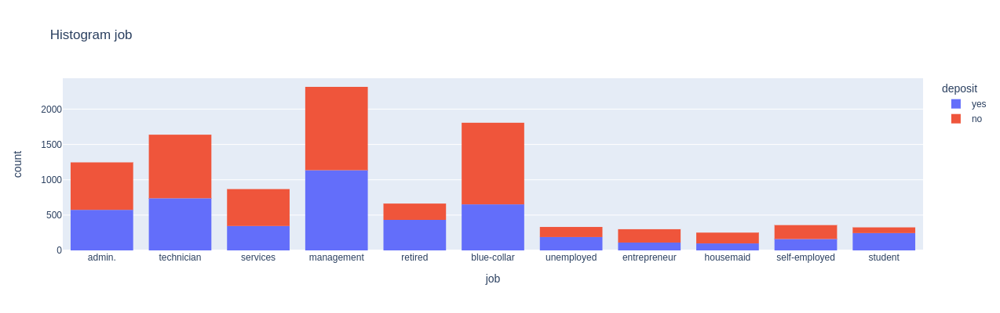

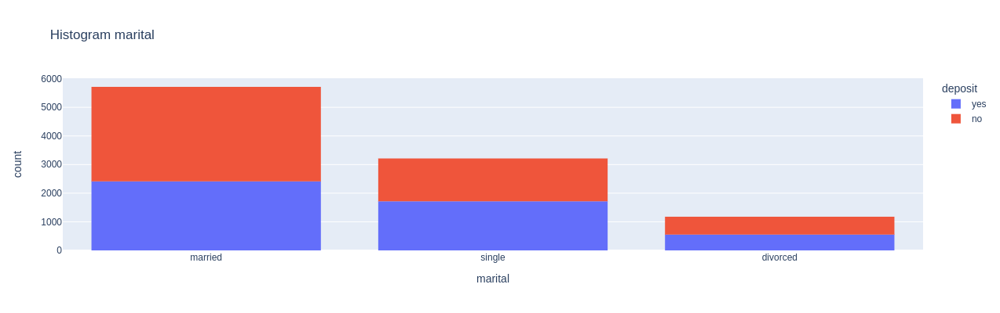

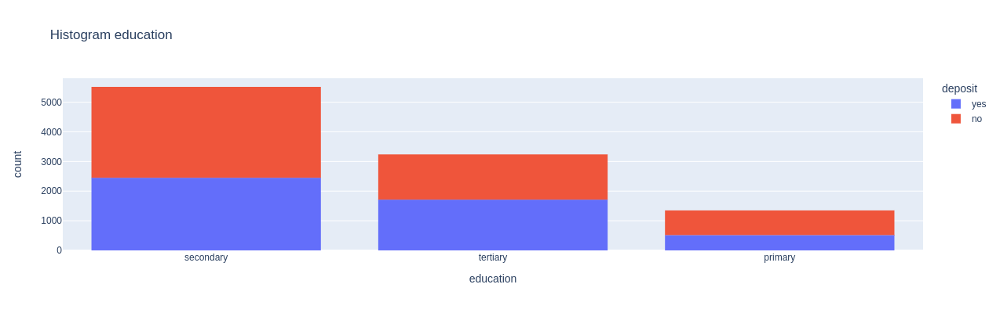

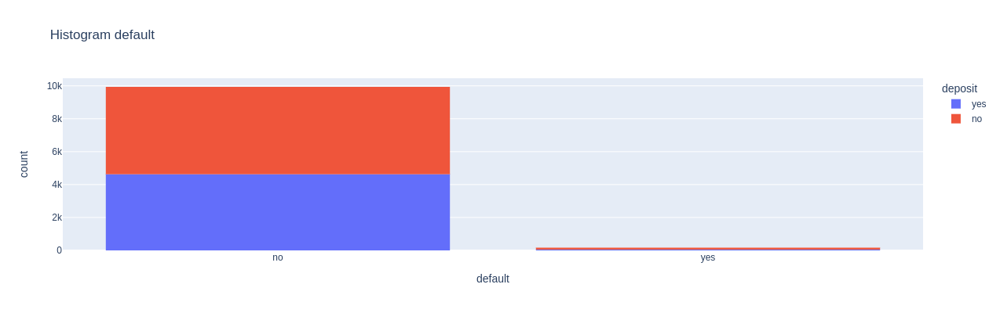

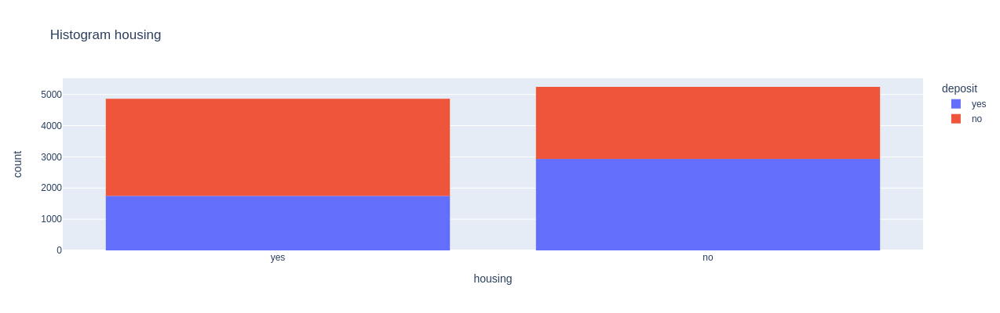

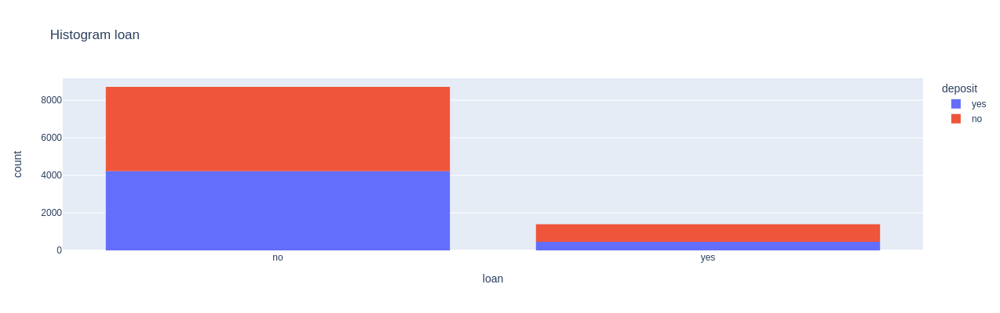

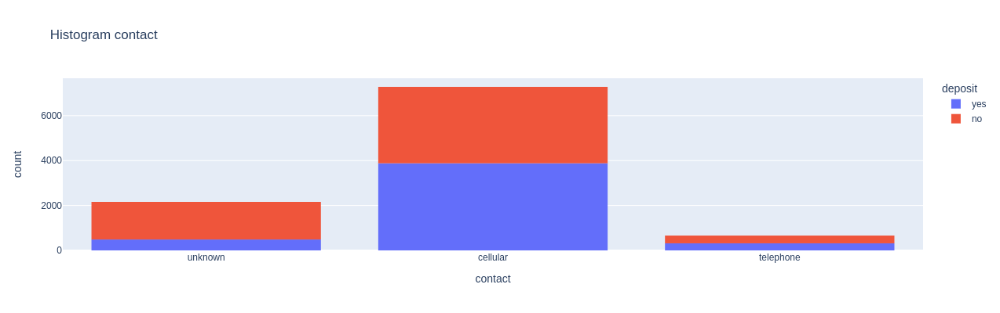

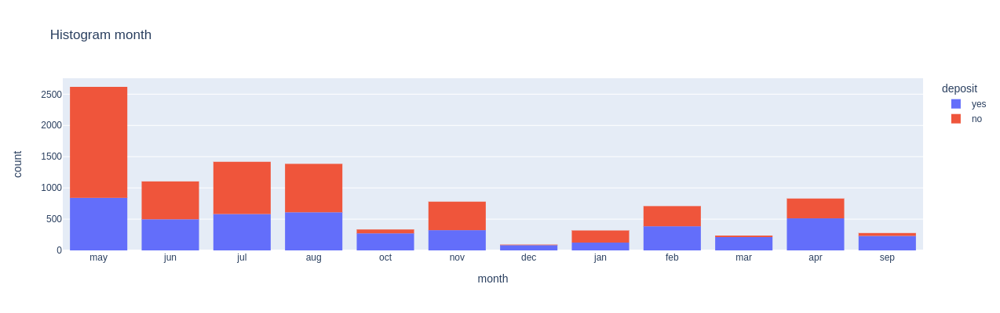

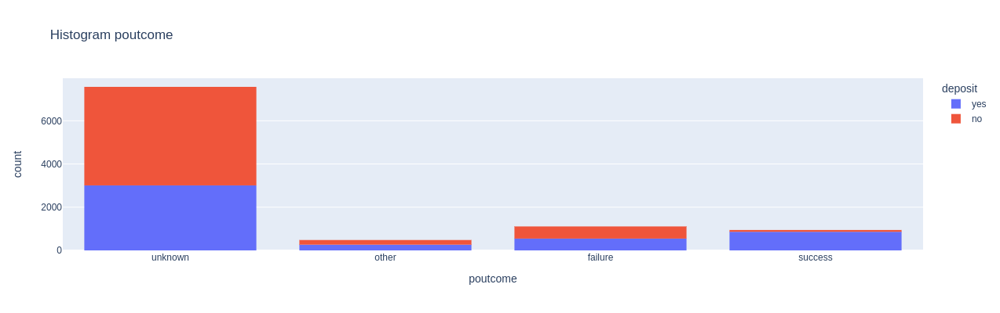

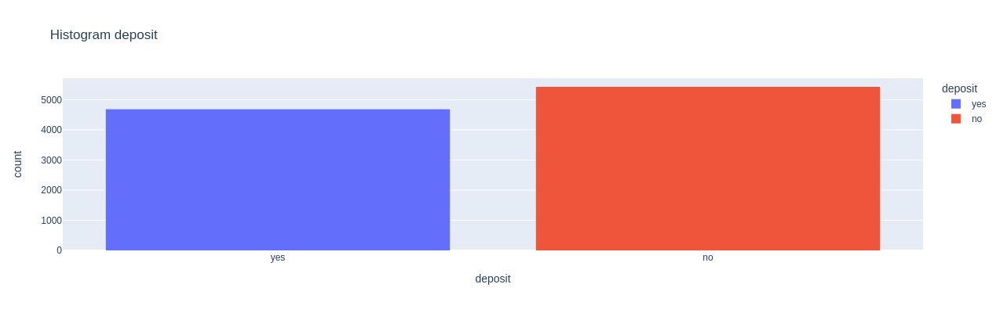

In [25]:
cat_cols = [col for col in cleaned.columns if cleaned[col].dtype == 'object']

for col in cat_cols:
    hist = px.histogram(cleaned, col, width = 800, height = 400, title=f'Histogram {col}', color='deposit')
    hist.show()

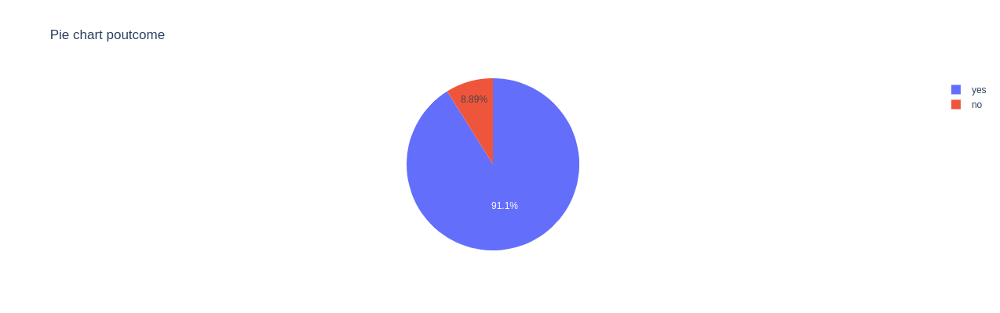

In [47]:
mask = cleaned['poutcome'] == 'success'

px.pie(cleaned[mask], 'deposit', title='Pie chart poutcome', width=400, height=400)

Анализ категориальных признаков позволил выявить следующие наблюдения:

* среди всех профессий более склонны к открытию дипозитов две каттегории граждан: студенты и пенсионеры
* клиенты с семейным статусом single более склонны к открытию дипозита
* не имеющие ипотеки клиенты более склонны к открытию дипозита;
* в мае месяце в придверии летних отпусков, клиенты банка в большей степени не открывают дипозиты 
* 91% открывших депозит в рамках предыдущей рекламной компании открыли депозит и в рамках текущей рк

In [13]:
cleaned.groupby(['poutcome', 'deposit'])['deposit'].count()

poutcome  deposit
failure   no          562
          yes         547
other     no          216
          yes         265
success   no           84
          yes         861
unknown   no         4562
          yes        3008
Name: deposit, dtype: int64

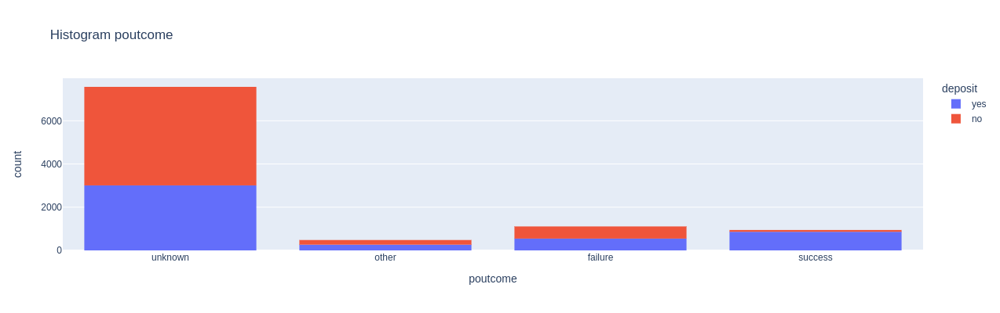

In [12]:
px.histogram(cleaned, 'poutcome', color='deposit', title=f'Histogram poutcome', width=800, height=400)

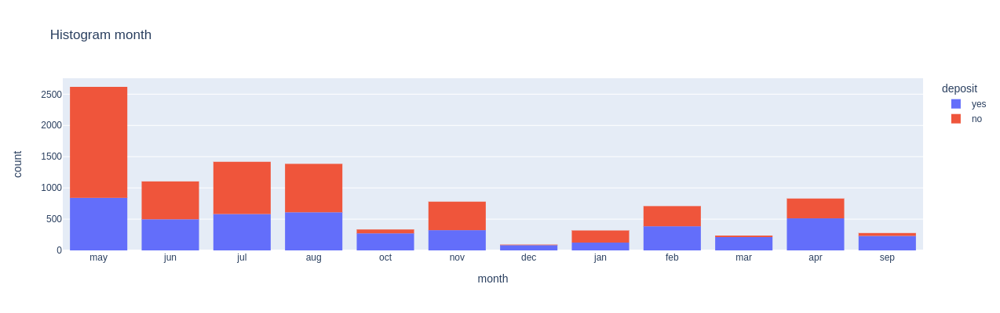

In [15]:
px.histogram(cleaned, 'month', color='deposit', title='Histogram month', width=800, height=400)

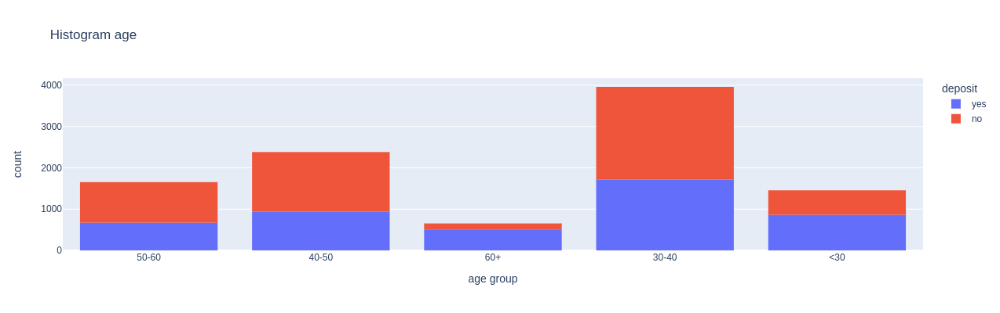

In [48]:
# создадим возрастные группы и определим, в каких группах более склонны открывать депозит, чем отказываться от предложения

def get_age_group(age):
    if age < 30:
        return '<30'
    elif age >= 30 and age < 40:
        return '30-40'
    elif age >= 40 and age < 50:
        return '40-50'
    elif age >= 50 and age < 60:
        return '50-60'
    else:
        return '60+'
    
cleaned['age group'] = cleaned['age'].apply(get_age_group)

px.histogram(cleaned, 'age group', color='deposit', title='Histogram age', width=800, height=400)

Наше предположение оказалось верным. Клиенты, чей возраст превышает 60 лет, а так же молодые люди, чей возраст меньше 30 лет чаще предпочитают открывать депозит

In [50]:
# Построим сводную таблицу, чтобы определить люди с каким образованием и семейным статусом наиболее многочисленны
#(если рассматривать тех, кто открыл депозит)
mask = cleaned['deposit'] == 'yes'

pivot = pd.pivot_table(
    cleaned[mask],
    values = 'deposit',
    columns = 'education',
    index = 'marital',
    aggfunc = 'count'
)
pivot

education,primary,secondary,tertiary
marital,,,
divorced,96,283,174
married,339,1289,784
single,82,879,755


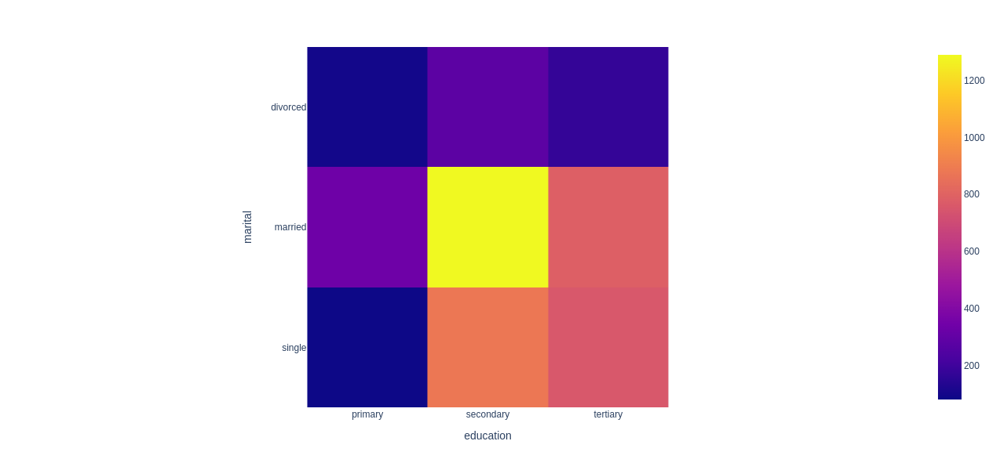

In [18]:
px.imshow(pivot, width=800, height=600)

In [15]:
mask = cleaned['deposit'] == 'no'

pivot = pd.pivot_table(
    cleaned[mask],
    values = 'deposit',
    columns = 'education',
    index = 'marital',
    aggfunc = 'count'
)
pivot

education,primary,secondary,tertiary
marital,,,
divorced,91,370,163
married,641,1830,832
single,100,866,531


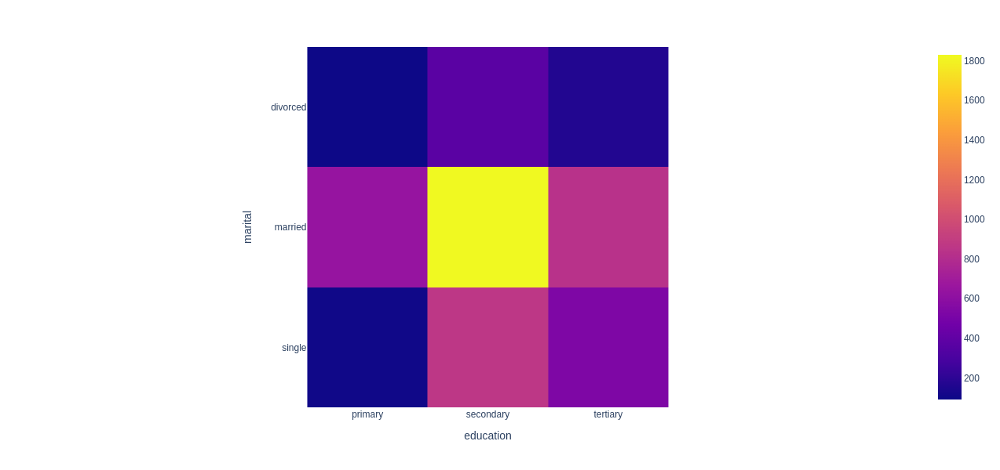

In [57]:
px.imshow(pivot, width=800, height=600)

## Преобразование данных

Приступим к преобразованию данных и их подготовки к передаче в обучающую модель.

In [51]:
encoder = LabelEncoder()
data_encoder = encoder.fit_transform(cleaned['education'])

data_encoder

array([1, 1, 1, ..., 1, 1, 1])

In [52]:
cleaned['education'] = data_encoder

In [53]:
encoder = LabelEncoder()
data_encoder = encoder.fit_transform(cleaned['age group'])

cleaned['age group'] = data_encoder

cleaned['age group'].value_counts()

0    3961
1    2382
2    1654
4    1455
3     653
Name: age group, dtype: int64

In [54]:
cols = ['deposit', 'default', 'loan', 'housing']

for col in cols:
    cleaned[col] = cleaned[col].apply(lambda x: 1 if x == 'yes' else 0)

In [55]:
x = cleaned['default'].mean() + cleaned['loan'].mean() + cleaned['housing'].mean()
x

0.6354280059376547

In [56]:
df_enc = pd.get_dummies(cleaned)

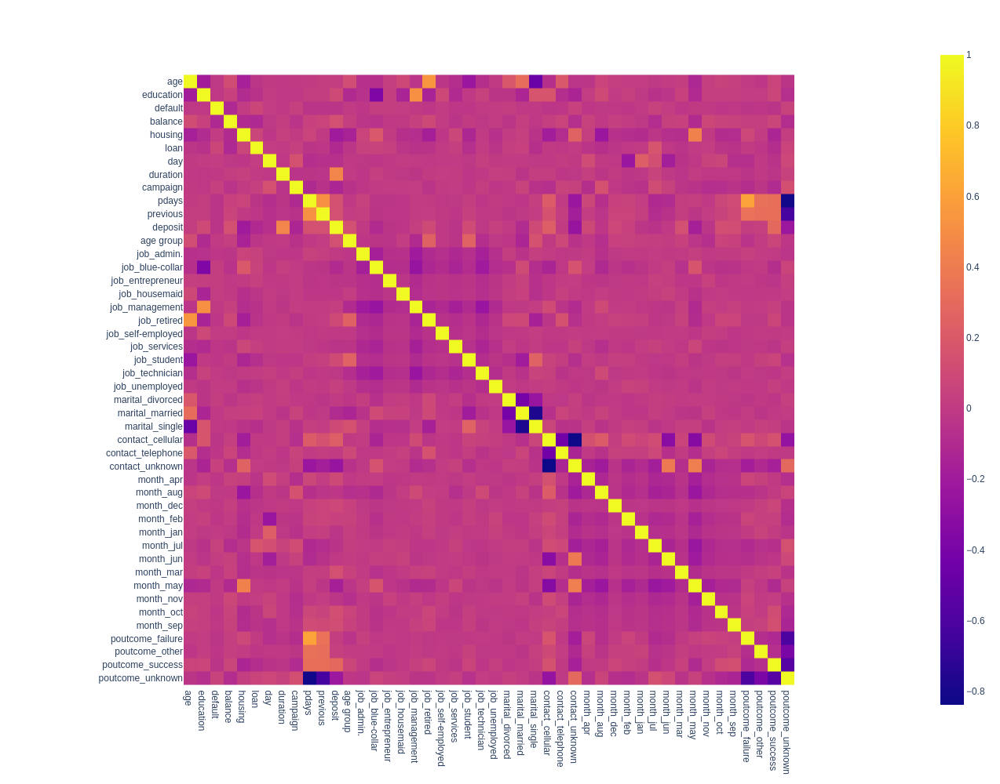

In [57]:
# построим корреляционную матрицу и оценим данные на предмет наличия мультиколлинеарности
px.imshow(df_enc.corr(), width=1000, height=1000)


In [28]:
df_enc.to_csv('out.zip',index=False)

In [61]:
df = pd.read_csv('out.zip') 

In [62]:
X = df.drop(['deposit'], axis=1)
y = df['deposit']
 
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state = 42, test_size = 0.33)

In [65]:
from sklearn.linear_model import LogisticRegression
f1_score = {}

for k in range(10, 30):
    k_best = SelectKBest(f_classif, k=k)
    X_train_new = k_best.fit_transform(X_train, y_train)
    
    col_names = k_best.get_feature_names_out()
    
    X_train_best = pd.DataFrame(X_train_new, columns = col_names)
    X_train_new = X_train[col_names].reset_index(drop=True)
    X_test_new = X_test[col_names].reset_index(drop=True)
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(X_train_new)
    
    X_train_scaled = scaler.transform(X_train_new)
    X_test_scaled = scaler.transform(X_test_new)
    
    X_train_scaled[:,0].mean()
        
    model = LogisticRegression(solver='sag', random_state=42)
    
    model.fit(X_train_scaled, y_train)
    
    y_pred = model.predict(X_test_scaled)
    f1_score[k] = metrics.f1_score(y_test, y_pred)
    #f1_score.append(metrics.f1_score(y_test, y_pred))

In [69]:
max_score = 0
best_feature_count = 0
for count, score in f1_score.items():
    if score > max_score:
        max_score = score
        best_feature_count = count

print(f'{best_feature_count}:{round(max_score, 2)}') 

24:0.79


In [70]:
k_best = SelectKBest(f_classif, k=best_feature_count)
X_train_new = k_best.fit_transform(X_train, y_train)

col_names = k_best.get_feature_names_out()

X_train_best = pd.DataFrame(X_train_new, columns = col_names)
X_train_best

,education,balance,housing,loan,duration,campaign,pdays,previous,age group,job_blue-collar,...,contact_cellular,contact_unknown,month_apr,month_dec,month_mar,month_may,month_oct,month_sep,poutcome_success,poutcome_unknown
0,2.0,557.0,1.0,0.0,513.0,1.0,-1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,2.0,69.0,0.0,1.0,296.0,1.0,205.0,2.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,0.0,1.0,0.0,399.0,2.0,358.0,5.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,1.0,444.0,0.0,0.0,137.0,1.0,102.0,5.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1.0,1444.0,0.0,0.0,100.0,1.0,117.0,8.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6765,2.0,222.0,0.0,1.0,111.0,1.0,204.0,2.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6766,1.0,1777.0,1.0,0.0,796.0,5.0,154.0,1.0,2.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6767,0.0,3324.0,0.0,0.0,122.0,1.0,92.0,3.0,3.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
6768,1.0,209.0,0.0,0.0,605.0,2.0,-1.0,0.0,4.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [22]:
col_names

array(['balance', 'housing', 'duration', 'campaign', 'pdays', 'previous',
       'age group', 'contact_cellular', 'contact_unknown', 'month_mar',
       'month_may', 'month_oct', 'month_sep', 'poutcome_success',
       'poutcome_unknown'], dtype=object)

In [71]:
X_train = X_train[col_names].reset_index(drop=True)
X_test = X_test[col_names].reset_index(drop=True)

In [72]:
scaler = preprocessing.MinMaxScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled[:,0].mean()

0.5920236336779912

In [73]:
X_test_scaled[0,:].mean()

0.22205301304185573

In [74]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(solver='sag', random_state=42)

model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.86      0.83      1790
           1       0.82      0.76      0.79      1545

    accuracy                           0.81      3335
   macro avg       0.81      0.81      0.81      3335
weighted avg       0.81      0.81      0.81      3335



In [75]:
from sklearn import tree

model = tree.DecisionTreeClassifier(criterion='entropy', random_state=42)

model.fit(X_train_scaled, y_train)

y_test_pred = model.predict(X_test_scaled)
y_train_pred = model.predict(X_train_scaled)
print(metrics.classification_report(y_train, y_train_pred))
print(metrics.classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3634
           1       1.00      1.00      1.00      3136

    accuracy                           1.00      6770
   macro avg       1.00      1.00      1.00      6770
weighted avg       1.00      1.00      1.00      6770

              precision    recall  f1-score   support

           0       0.77      0.77      0.77      1790
           1       0.74      0.74      0.74      1545

    accuracy                           0.75      3335
   macro avg       0.75      0.75      0.75      3335
weighted avg       0.75      0.75      0.75      3335



In [76]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth':[3, 5, 7],
    'min_samples_split':[2, 5, 7, 10]
}

grid_search = GridSearchCV(
    estimator=tree.DecisionTreeClassifier(random_state=42),
    param_grid=param_grid,
)

grid_search.fit(X_train_scaled, y_train)
print(grid_search.best_params_)

{'max_depth': 7, 'min_samples_split': 10}


In [77]:
y_test_pred = grid_search.predict(X_test_scaled)
print(metrics.classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.83      0.83      0.83      1790
           1       0.80      0.80      0.80      1545

    accuracy                           0.81      3335
   macro avg       0.81      0.81      0.81      3335
weighted avg       0.81      0.81      0.81      3335



In [78]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(
    n_estimators=100,
    criterion='gini',
    max_depth=10,
    min_samples_leaf=5,
    random_state=42
)
model.fit(X_train_scaled, y_train)
y_pred = model.predict(X_test_scaled)

print(metrics.classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.86      0.83      0.84      1790
           1       0.81      0.85      0.83      1545

    accuracy                           0.84      3335
   macro avg       0.84      0.84      0.84      3335
weighted avg       0.84      0.84      0.84      3335



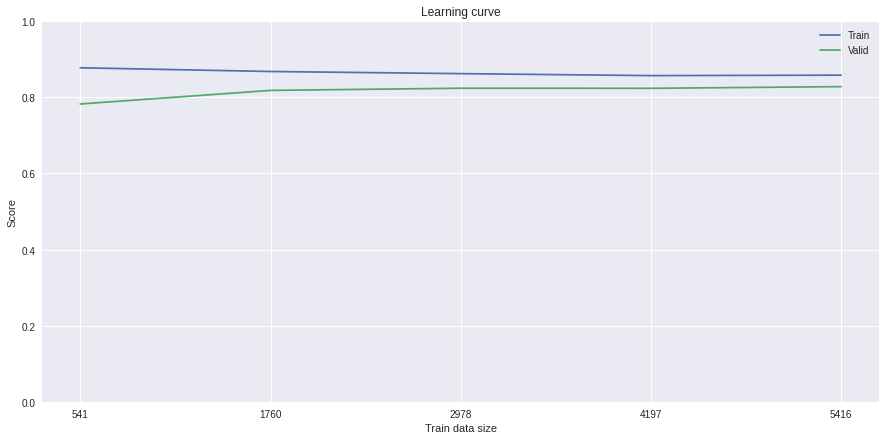

In [79]:
from sklearn import model_selection

skf = model_selection.StratifiedKFold(n_splits=5)

train_size, train_scores, valid_scores = model_selection.learning_curve(
    estimator=model,
    X = X_train_scaled,
    y = y_train,
    cv = skf,
    scoring = 'f1'
)

train_score_mean = np.mean(train_scores, axis=1)
valid_score_mean = np.mean(valid_scores, axis=1)

fig, ax = plt.subplots(figsize=(15,7))

ax.plot(train_size, train_score_mean, label='Train')
ax.plot(train_size, valid_score_mean, label='Valid')

ax.set_title('Learning curve')
ax.set_xlabel('Train data size')
ax.set_ylabel('Score')

ax.xaxis.set_ticks(train_size)
ax.set_ylim(0, 1)
ax.legend();

In [80]:
def plot_learning_curve(model, X, y, cv, scoring='f1', ax=None, title = ''):
    train_sizes, train_scores, valid_scores = model_selection.learning_curve(
        estimator=model,  
        X=X,  
        y=y,  
        cv=cv,
        scoring="f1"
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    valid_scores_mean = np.mean(valid_scores, axis=1)
    # Если координатной плоскости не было передано, создаём новую
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 4))  # фигура + координатная плоскость
    
    ax.plot(train_sizes, train_scores_mean, label="Train")
    ax.plot(train_sizes, valid_scores_mean, label="Valid")
    
    ax.set_title("Learning curve: {}".format(title))
    ax.set_xlabel("Train data size")
    ax.set_ylabel("Score")
    
    ax.xaxis.set_ticks(train_sizes)
    ax.set_ylim(0, 1)
    ax.legend()


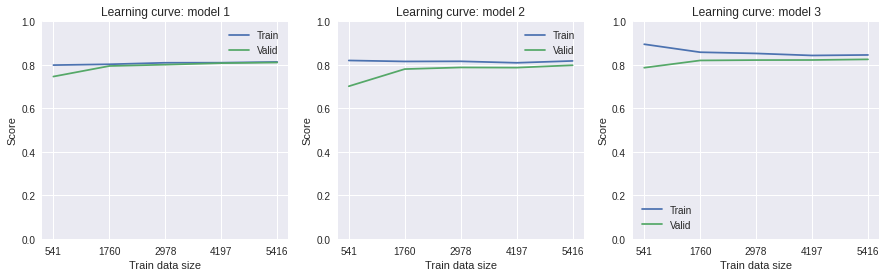

In [82]:
from sklearn.tree import DecisionTreeClassifier

models = [
    LogisticRegression(solver='sag', random_state=42),
    DecisionTreeClassifier(criterion='entropy', max_depth=7, min_samples_leaf=5, random_state=42),
    RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=7, min_samples_leaf=2, random_state=42)
]

skf = model_selection.StratifiedKFold(n_splits=5)

X = X_train_scaled
y = y_train

fig, axes = plt.subplots(1, 3, figsize=(15, 4)) 
for i, model in enumerate(models):
    plot_learning_curve(model, X, y, skf, ax=axes[i], title=f'model {i+1}')

In [84]:

from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(
    learning_rate=0.05,
    n_estimators=300,
    min_samples_leaf=5,
    max_depth=5,
    random_state=42
)

gb.fit(X_train_scaled, y_train)

y_test_pred = gb.predict(X_test_scaled)

print(metrics.f1_score(y_test, y_test_pred))

0.8276081424936387


In [85]:
from sklearn.ensemble import StackingClassifier

estimators = (
    ('lr', LogisticRegression(solver='sag', random_state=42)),
    ('dt', DecisionTreeClassifier(criterion='entropy', max_depth=17, min_samples_leaf=2, random_state=42)),
    ('gb', GradientBoostingClassifier(learning_rate=0.05, n_estimators=300, min_samples_leaf=5, max_depth=5, random_state=42))
)

reg = StackingClassifier(
    estimators=estimators,
    final_estimator = RandomForestClassifier(
            n_estimators=100,
            criterion='gini',
            max_depth=10,
            min_samples_leaf=5,
            random_state=42
    )
)

reg.fit(X_train_scaled, y_train)

y_test_pred = reg.predict(X_test_scaled)

print(metrics.classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.86      0.83      0.84      1790
           1       0.81      0.85      0.83      1545

    accuracy                           0.84      3335
   macro avg       0.83      0.84      0.84      3335
weighted avg       0.84      0.84      0.84      3335



<AxesSubplot:>

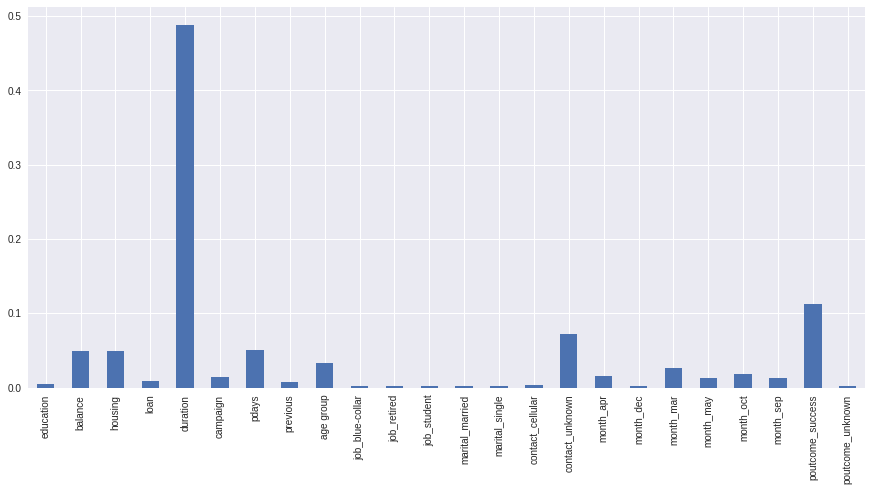

In [86]:
data = gb.feature_importances_
feature_imp = pd.Series(data, col_names)
feature_imp.plot(kind='bar', figsize=(15,7))

In [87]:
import optuna

def optuna_rf(trial):
    n_estimators = trial.suggest_int('n_estimators', 100, 200, 1)
    max_depth = trial.suggest_int('max_depth', 10, 30, 1)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 10, 1)
    
    model = ensemble.RandomForestClassifier(
        n_estimators = n_estimators,
        max_depth=max_depth,
        min_samples_leaf=min_samples_leaf
    )
    
    model.fit(X_train_scaled, y_train)
    score = metrics.f1_score(y_train, model.predict(X_train_scaled))
    
    return score

In [88]:
study = optuna.create_study(study_name = 'RandomForestClassifier', direction='maximize')

study.optimize(optuna_rf, n_trials=20)

[I 2022-06-30 16:44:20,684] A new study created in memory with name: RandomForestClassifier
[I 2022-06-30 16:44:21,563] Trial 0 finished with value: 0.8716585899640457 and parameters: {'n_estimators': 118, 'max_depth': 15, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.8716585899640457.
[I 2022-06-30 16:44:22,585] Trial 1 finished with value: 0.8837715886105493 and parameters: {'n_estimators': 118, 'max_depth': 25, 'min_samples_leaf': 4}. Best is trial 1 with value: 0.8837715886105493.
[I 2022-06-30 16:44:23,769] Trial 2 finished with value: 0.8734808351511375 and parameters: {'n_estimators': 156, 'max_depth': 12, 'min_samples_leaf': 3}. Best is trial 1 with value: 0.8837715886105493.
[I 2022-06-30 16:44:25,270] Trial 3 finished with value: 0.9277769074103087 and parameters: {'n_estimators': 177, 'max_depth': 27, 'min_samples_leaf': 2}. Best is trial 3 with value: 0.9277769074103087.
[I 2022-06-30 16:44:26,617] Trial 4 finished with value: 0.8759738236210658 and parameters: {'n_

In [89]:
print(study.best_params)
print(study.best_value)

{'n_estimators': 177, 'max_depth': 27, 'min_samples_leaf': 2}
0.9277769074103087


In [90]:
model = ensemble.RandomForestClassifier(**study.best_params, random_state=42)

model.fit(X_train_scaled, y_train)

print(metrics.f1_score(y_test, model.predict(X_test_scaled)))
print(metrics.classification_report(y_test, model.predict(X_test_scaled)))

0.8266078184110971
              precision    recall  f1-score   support

           0       0.86      0.82      0.84      1790
           1       0.81      0.85      0.83      1545

    accuracy                           0.84      3335
   macro avg       0.83      0.84      0.83      3335
weighted avg       0.84      0.84      0.84      3335



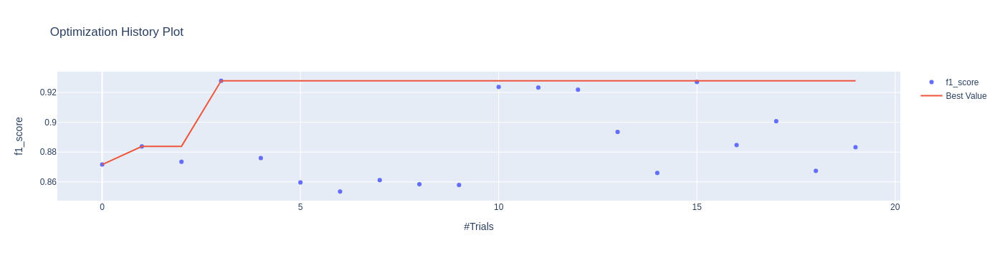

In [91]:
optuna.visualization.plot_optimization_history(study, target_name="f1_score")